In [1]:
import cv2
import numpy as np
import os 
import glob
import matplotlib.pyplot as plt

In [2]:
camera = 'MusolaParking'
date = '19Nov'

images_folder = f'.../kasanka-bats/frames/{date}/{camera}'

In [ ]:
image_folder = os.path.join(images_folder, '*', '*.jpg')
image_files = sorted(glob.glob(image_folder))
print(image_folder)
print(f'{len(image_files)} files found')

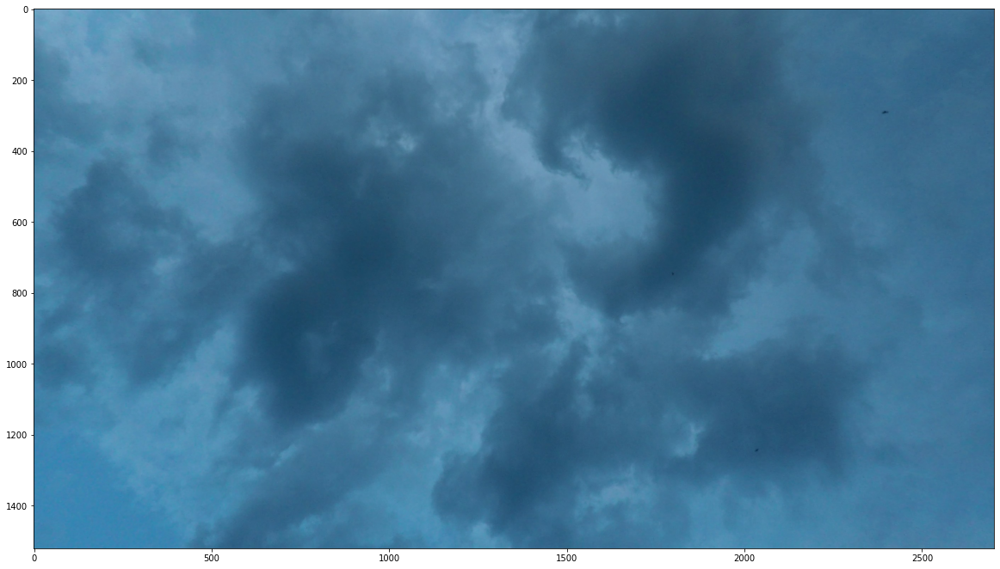

In [4]:
test_ind = 41709 # no bats frame 39519
test_frame = cv2.imread(image_files[test_ind])
test_frame = cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(test_frame)

In [128]:
first_frame = 64000
last_frame = 64690
every_n_frames = 1

In [129]:
base_frame = cv2.imread(image_files[first_frame])

for file in image_files[first_frame+1:last_frame+1:every_n_frames]:
    new_frame = cv2.imread(file)
    base_frame = np.where(new_frame < base_frame, new_frame, base_frame)
base_frame = cv2.cvtColor(base_frame, cv2.COLOR_BGR2RGB)

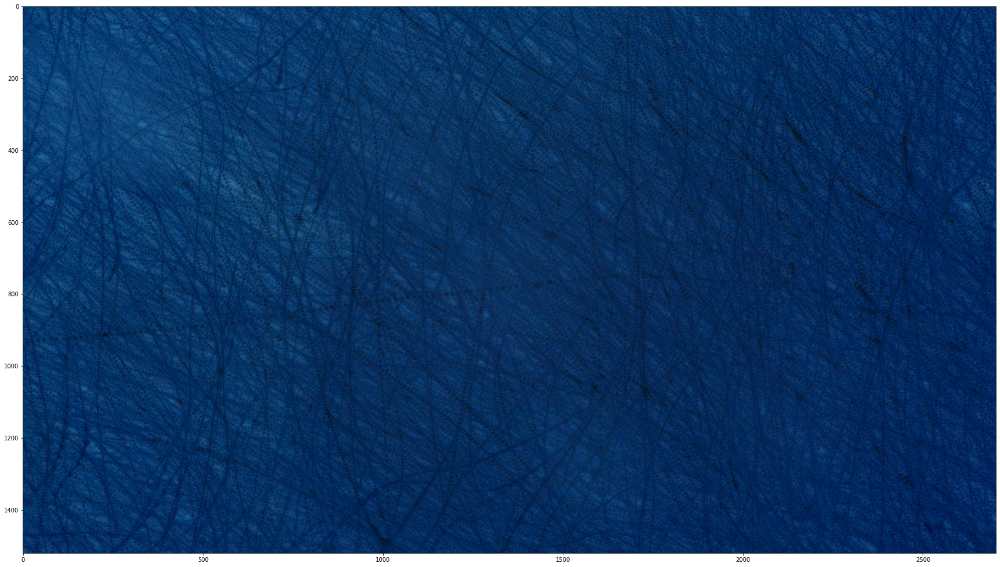

In [130]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

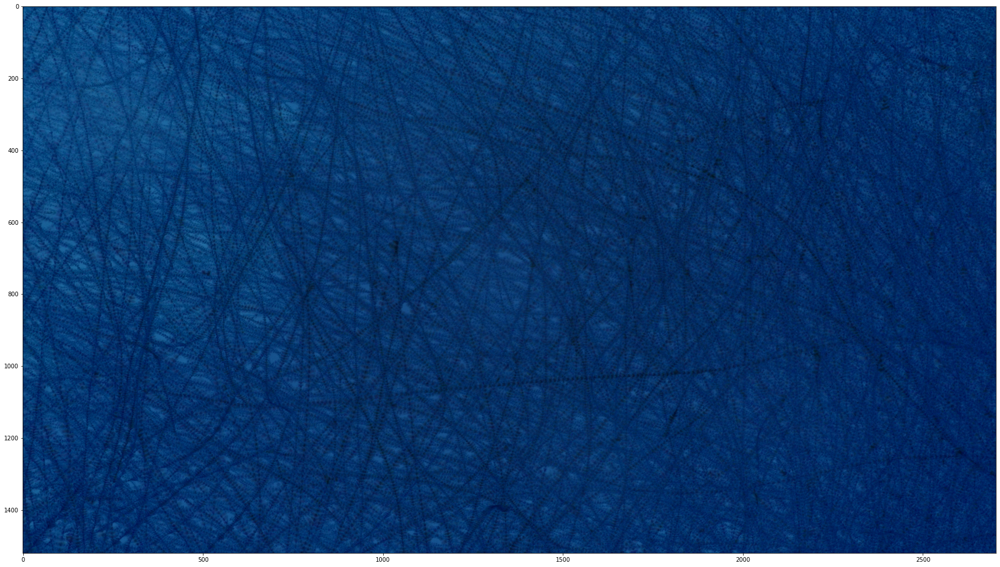

In [127]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

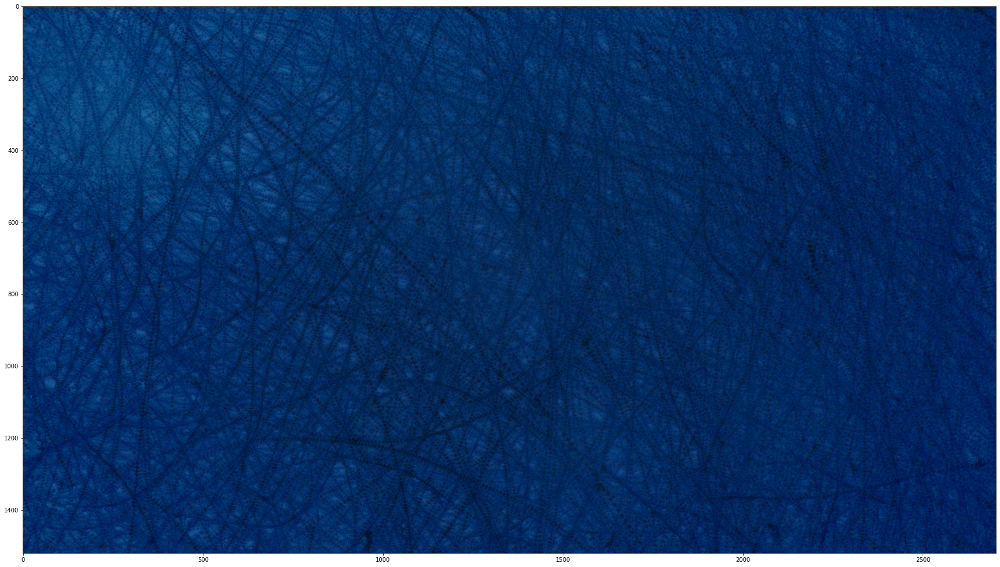

In [124]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

In [5]:
save_folder = '.../bat-videos/fun-videos'

In [6]:
def get_frames(frame_files, first_frame, last_frame, imscale):
    frames = [cv2.imread(f) for f in frame_files[first_frame:last_frame]]
    for ind, frame in enumerate(frames):
        frames[ind] = cv2.resize(frame, 
                                 (frame.shape[1]//imscale, 
                                  frame.shape[0]//imscale))
    return frames

def make_frame(frames):
    base_frame = frames[0]
    for frame in frames[1:]:
        base_frame = np.where(frame < base_frame, frame, base_frame)
    return base_frame

In [7]:
scale = 1
first_frame = 41709
last_frame = 46400
speed = 1

frames = get_frames(image_files, first_frame, last_frame, scale)

In [8]:
start_timelapse = 90
flashes = []
# flashes.extend([-i for i in range(90, 120)])
# flashes.extend([-i for i in range(130, 140)])
# flashes.extend([-i for i in range(160, 165)])
# flashes.extend([-i for i in range(175, 180)])
# flashes.extend([-i for i in range(190, 195)])
# flashes.extend([i for i in range(210, 230)])

def logn(value, n):
    return np.log(value)/np.log(n)

# n = 1.5
# flashes = [start_timelapse - i for i in range(start_timelapse, 0, -1) if i**n == int(i**n)]
# flashes = [start_timelapse - i for i in range(start_timelapse, 0, -1) if logn(i, n) == int(logn(i, n))]
start_normal = len(frames)

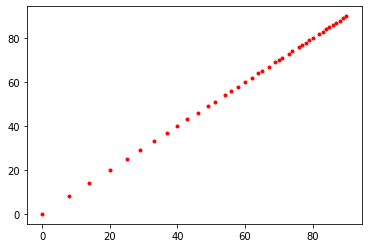

In [9]:
num_flashes = 40
flashes = np.linspace(1, 10, num_flashes)
flashes = np.log2(flashes)/np.log2(4)
flashes = flashes / np.max(flashes) * start_timelapse
flashes = flashes.astype(int)
plt.plot(flashes, flashes, 'r.')

In [11]:
speed = 2
video_outfile = os.path.join(save_folder, f'f{date}_{camera}_speed_{speed}_ff_{first_frame}_lf_{last_frame}.mp4')

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (frames[0].shape[1], frames[0].shape[0]))

base_frame = frames[0]
first_flash_group_frame = None

for ind, frame in enumerate(frames[:]):
    if ind < start_timelapse:
        if ind in flashes:
            base_frame = np.where(frame < base_frame, 
                                  frame, base_frame)
#             video_writer.write(base_frame)
            first_flash_group_frame = None
        elif -ind in flashes:
            if first_flash_group_frame is None:
                base_frame = np.where(frame < base_frame, 
                                      frame, base_frame)
#             video_writer.write(base_frame)
        else:
#             video_writer.write(base_frame)
            first_flash_group_frame = None
    elif ind < start_normal:
        if base_frame is None:
            base_frame = frame
        else:
            base_frame = np.where(frame < base_frame, 
                                  frame, base_frame)
    else:
        video_writer.write(frame)
        continue
    if ind % speed == 0:
        video_writer.write(base_frame)
    

video_writer.release()

In [11]:
len(frames)

1691

In [102]:

print('starting video...')

video_outfile = os.path.join(save_folder, f'r_{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (frames[0].shape[1], frames[0].shape[0]))
reverse_frames = []
base_frame = None
for ind, frame in enumerate(frames[::-1]):
    if ind % 150 == 0:
        print(f'frame {ind}')
    if ind > normal_switch:
        if base_frame is None:
            base_frame = frame
        else:
            base_frame = np.where(frame < base_frame, frame, base_frame)
        if ind % speed == 0:
            reverse_frames.append(base_frame)
    else:
        reverse_frames.append(frame)

for frame in reverse_frames[::-1]:
    video_writer.write(frame)
video_writer.release()

starting video...
frame 0


NameError: name 'normal_switch' is not defined

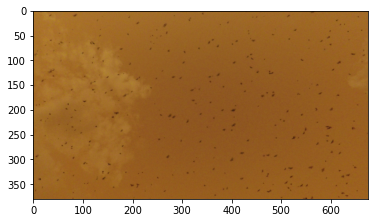

In [133]:
plt.imshow(frame)

In [74]:
scale = 2
first_frame = 39900
last_frame = 40890
every_n_frames = 1

video_outfile = os.path.join(save_folder, f'{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

base_frame = cv2.imread(image_files[first_frame])
base_frame = cv2.resize(base_frame, 
                        (base_frame.shape[1]//scale, 
                         base_frame.shape[0]//scale))


fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (base_frame.shape[1], base_frame.shape[0]))

video_writer.write(base_frame)
for file in image_files[first_frame+1:last_frame+1:every_n_frames]:
    new_frame = cv2.imread(file)
    new_frame = cv2.resize(new_frame, 
                        (new_frame.shape[1]//scale, 
                         new_frame.shape[0]//scale))
    base_frame = np.where(new_frame < base_frame, new_frame, base_frame)
    
    video_writer.write(base_frame)
video_writer.release()

KeyboardInterrupt: 

In [45]:
print(np.array(base_frame.shape) // 3)

[506 901   1]


In [47]:

small = cv2.resize(base_frame, (base_frame.shape[1]//scale, base_frame.shape[0]//scale))

In [48]:
small.shape

(676, 380, 3)